# Experiment # 2. - GNN as feature extraction. tSNE.
**Clustering Visualization with t-SNE**:
- Use t-distributed Stochastic Neighbor Embedding (t-SNE) as a post-processing step after GNN feature extraction.
- This experiment aims to visualize how nodes of different classes are clustered in a 2D space.
- Use a dataset with clear class separations, like the Cora dataset, to observe the effects of DR on cluster quality.

Import section

In [2]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.datasets import Amazon
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
from utils import *

random_state = 0
random.seed(0)
torch.manual_seed(0)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Is cuda available?", torch.cuda.is_available())

Is cuda available? True


## 1 Training the model

Loading the Cora dataset:

In [3]:
dataset = Amazon(root='.', name='Computers')
data = dataset[0].to(device) # Move data to GPU

# prepare variables for further tSNE experiments
data_x_cpu = dataset[0].x.cpu().detach().numpy()
data_y_cpu = dataset[0].y.cpu().numpy()

Defining the GCN model (with output_dim=16) and optimizer:

In [4]:
model = GCN(input_dim=dataset.num_node_features, hidden_dim=64, output_dim=16).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

Training loop and preparing the GNN output:

In [5]:
generate_train_test(data)

train_loop(200, model, optimizer, data)

# Extract features with the trained GNN
model.eval()
with torch.no_grad():
    gnn_output = model(data)

# Move the features to CPU for t-SNE
gnn_output = gnn_output.cpu().numpy()

## 2 Default tSNE on GNN output

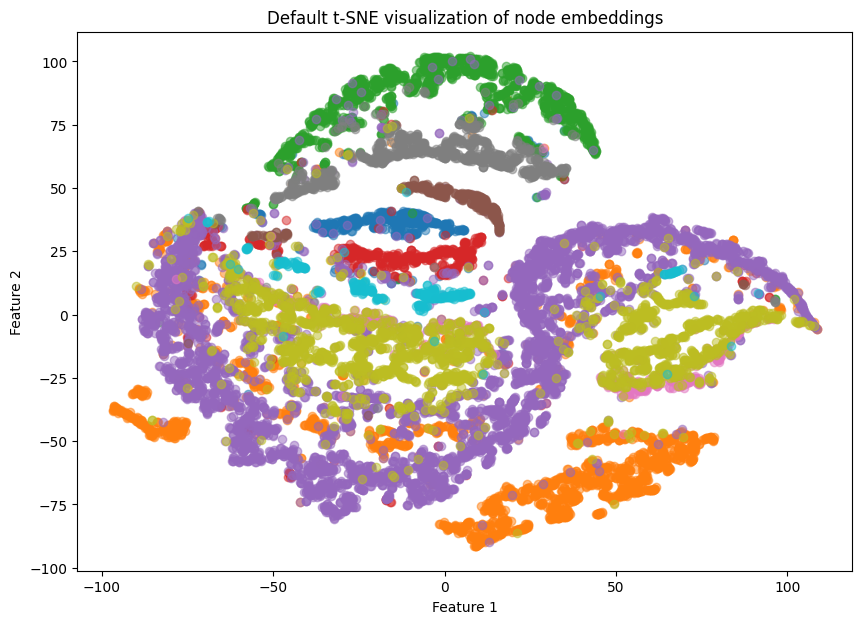

In [5]:
tsne = TSNE(n_components=2, random_state=random_state)
tsne_results = tsne.fit_transform(gnn_output)

visualise(tsne_results, data_y_cpu, 'Default t-SNE visualization of node embeddings')

## 3 tSNE fine-tuning on GNN output

### 3.1 Metric

In the experiment presented above there was euclidean distance used. Now let's investigate also cosine, l1, l2 and manhattan.

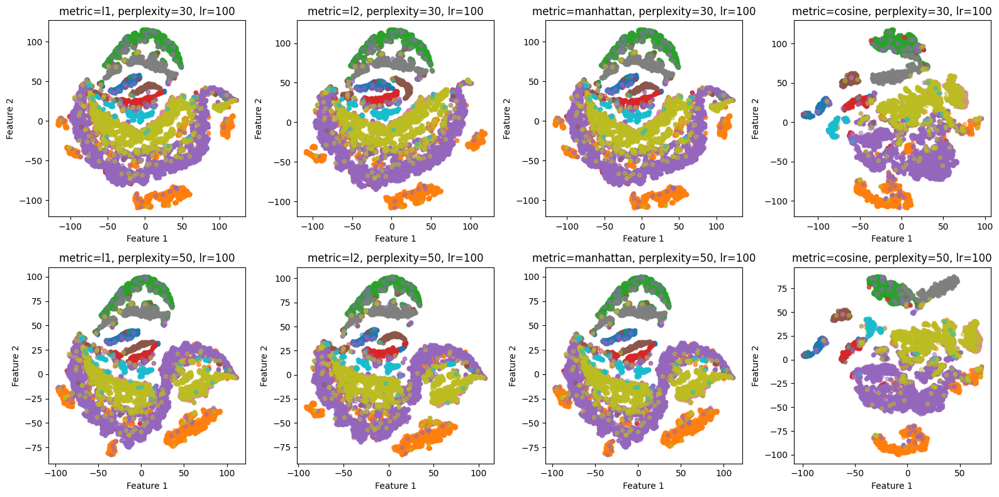

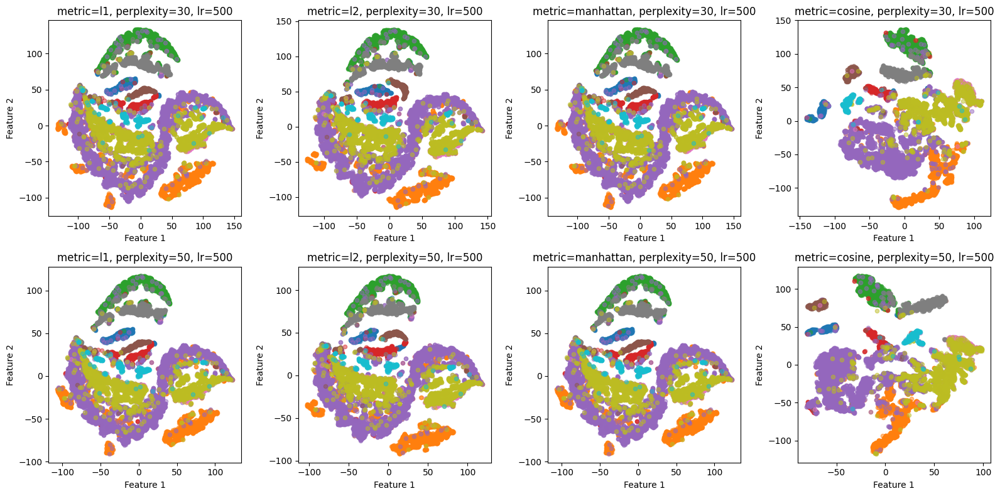

In [7]:
n_iter = 2000
for learning_rate in [100, 500]:
    fig, axs = plt.subplots(2, 4, figsize=(16, 8)) 
    axs = axs.flatten()
    i = 0
    for perplexity in [30, 50]:
        for dist in ['l1', 'l2', 'manhattan', 'cosine']:
            tsne = TSNE(n_components=2, random_state=random_state, n_iter=n_iter, perplexity=perplexity, learning_rate=learning_rate, metric=dist)
            tsne_results = tsne.fit_transform(gnn_output)
            plot_no_show(axs[i], tsne_results, data_y_cpu, f'metric={dist}, perplexity={perplexity}, lr={learning_rate}', size=20)
        
            i += 1

    plt.tight_layout()
    plt.show()

### 3.4 n_iter vs learning_rate vs perplexity on cosine distance

Definitely **cosine** metric is the best one. Now let's double check the previous experiments with this metric.

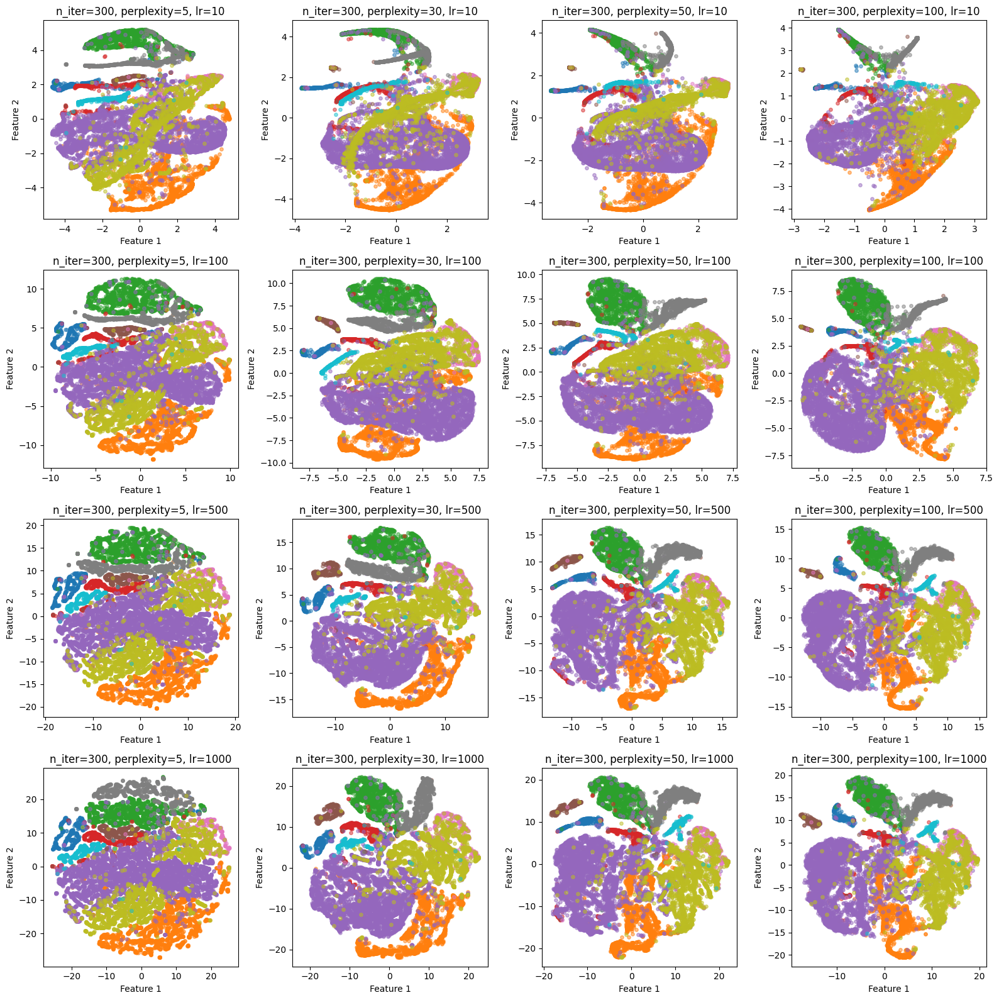

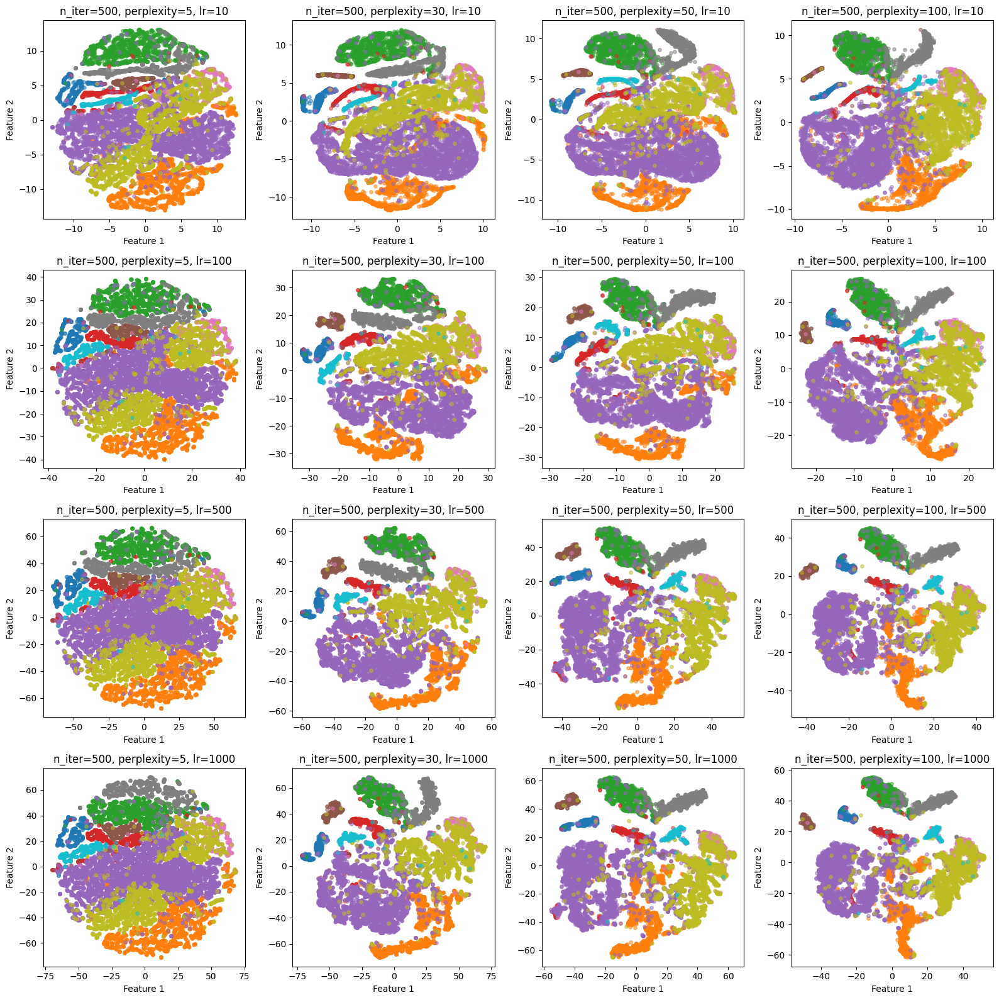

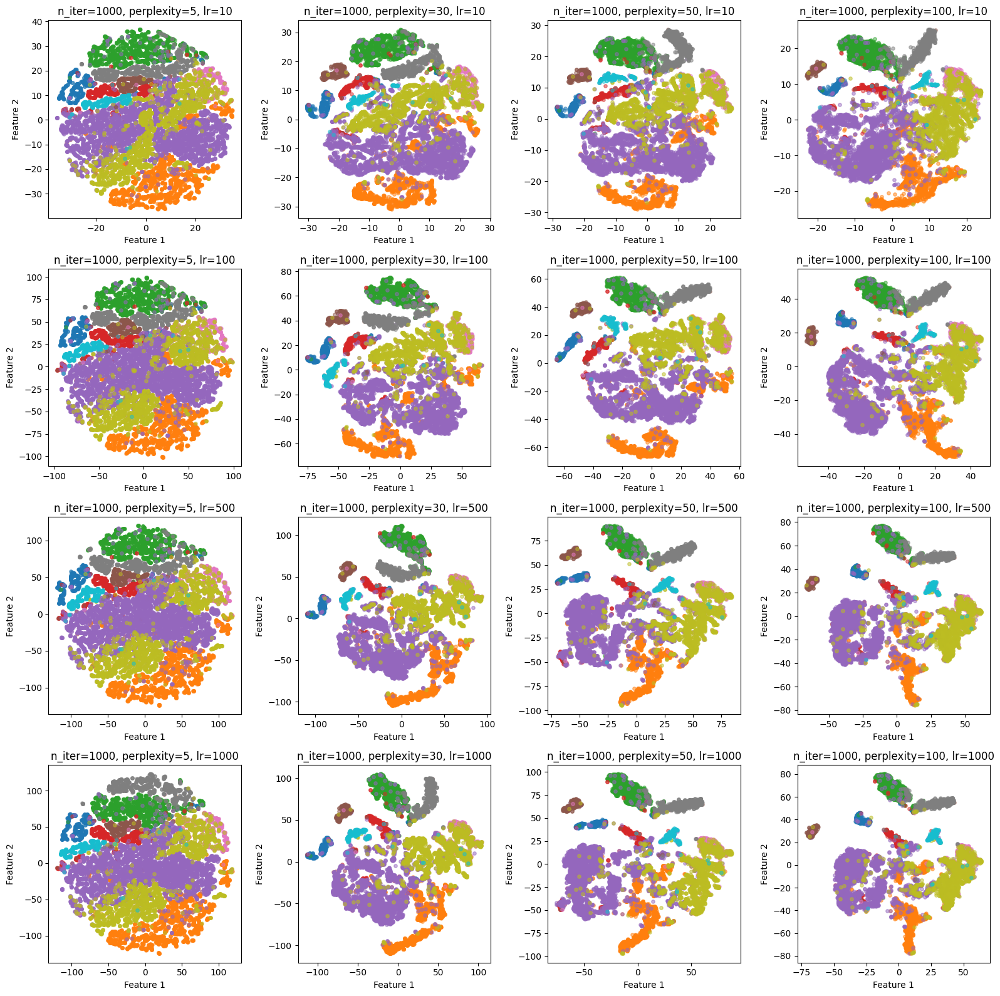

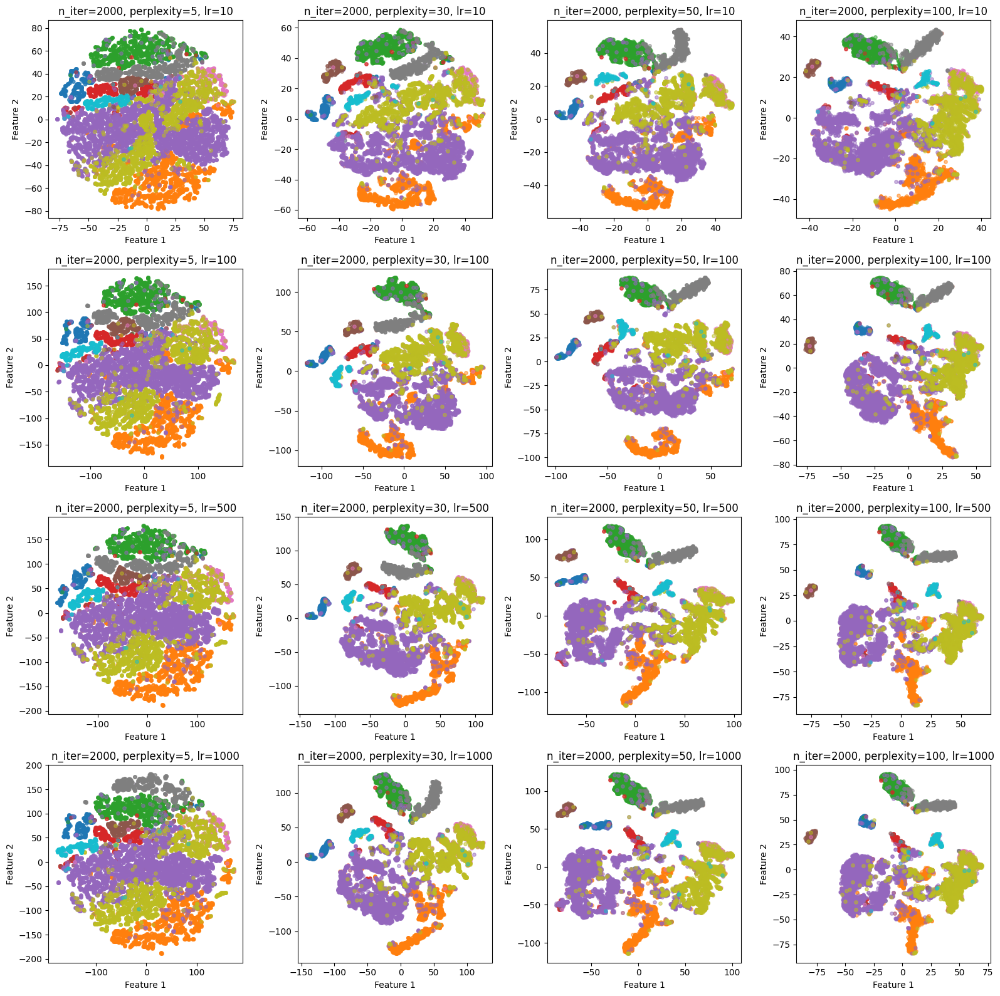

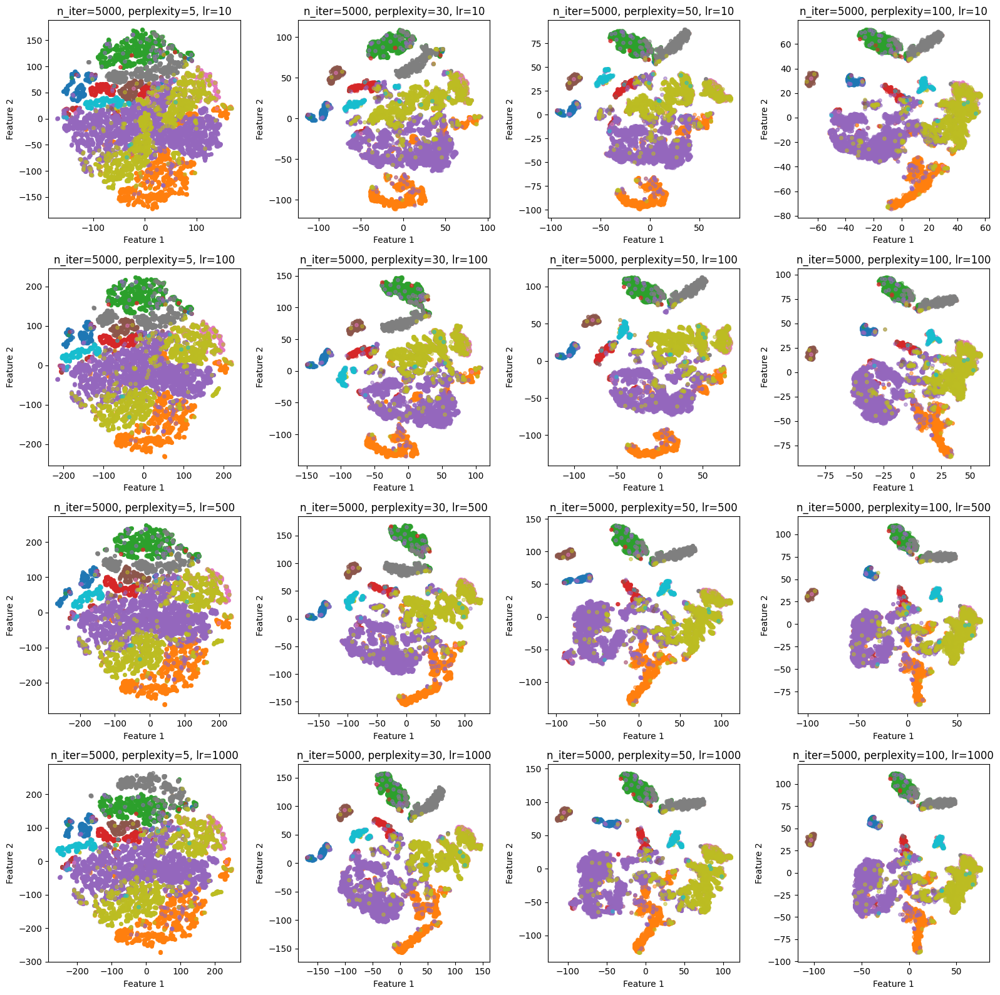

In [9]:
for n_iter in [300, 500, 1000, 2000, 5000]:
    fig, axs = plt.subplots(4, 4, figsize=(16, 16)) 
    axs = axs.flatten()
    i = 0
    for learning_rate in [10, 100, 500, 1000]:
        for perplexity in [5, 30, 50, 100]:
            tsne = TSNE(n_components=2, random_state=random_state, n_iter=n_iter, perplexity=perplexity, learning_rate=learning_rate, metric='cosine')
            tsne_results = tsne.fit_transform(gnn_output)
            plot_no_show(axs[i], tsne_results, data_y_cpu, f'n_iter={n_iter}, perplexity={perplexity}, lr={learning_rate}', size=15)
        
            i += 1

    plt.tight_layout()
    plt.show()

### 3.5 Conclusions
The best parameters seem to be n_iter=2000, perplexity=50, learning_rate=500, metric='cosine'.

## 4 Fine-tuned tSNE vs default tSNE on GNN output

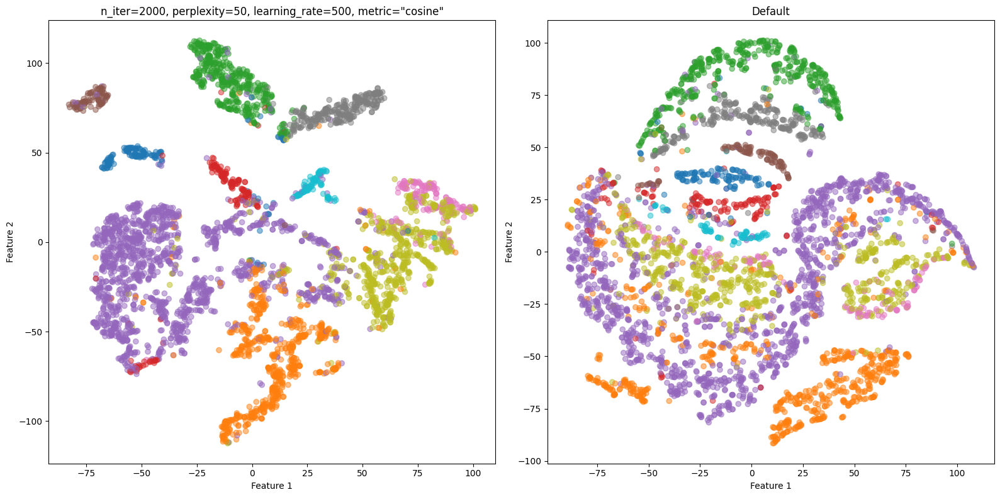

In [6]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8)) 
tsne = TSNE(n_components=2, random_state=random_state, n_iter=2000, perplexity=50, learning_rate=500, metric='cosine')
tsne_results = tsne.fit_transform(gnn_output)
plot_no_show(axs[0], tsne_results, data_y_cpu, f'n_iter=2000, perplexity=50, learning_rate=500, metric="cosine"')
    

tsne = TSNE(n_components=2, random_state=random_state)
tsne_results = tsne.fit_transform(gnn_output)
plot_no_show(axs[1], tsne_results, data_y_cpu, f'Default')

plt.tight_layout()
plt.show()

## 5. Default tSNE on original features

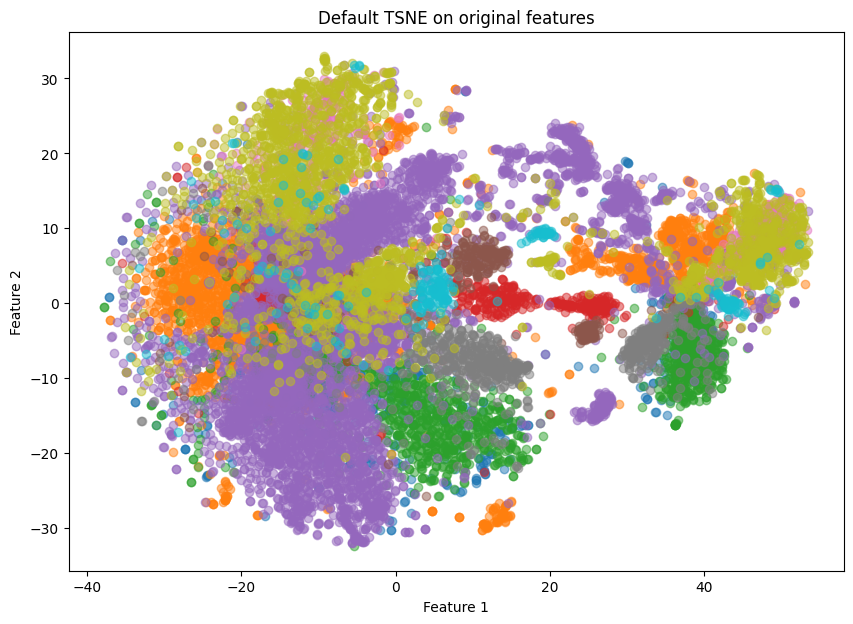

In [10]:
tsne = TSNE(n_components=2, random_state=random_state)
tsne_results = tsne.fit_transform(data_x_cpu)
visualise(tsne_results, data_y_cpu, f'Default TSNE on original features')

## 6. tSNE fine-tuning on original features
Experiments on different parameters for TSNE on original features.

### 6.1 Metric

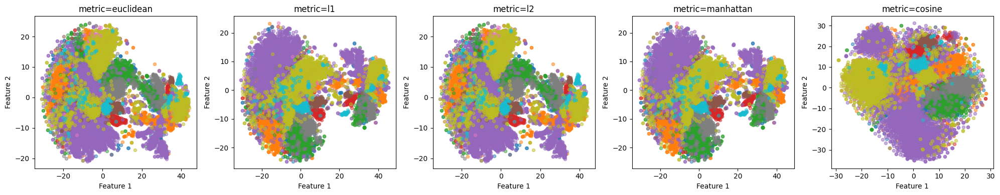

In [11]:
n_iter = 2000
perplexity=50
learning_rate=500
fig, axs = plt.subplots(1, 5, figsize=(20, 4)) 
axs = axs.flatten()
i = 0
for dist in ['euclidean', 'l1', 'l2', 'manhattan', 'cosine']:
    tsne = TSNE(n_components=2, random_state=random_state, n_iter=n_iter, perplexity=perplexity, learning_rate=learning_rate, metric=dist)
    tsne_results = tsne.fit_transform(data_x_cpu)
    plot_no_show(axs[i], tsne_results, data_y_cpu, f'metric={dist}', size=20)

    i += 1

plt.tight_layout()
plt.show()

Again cosine metric proved to be the best one. Let's redo the previous experiments for cosine metric.

### 6.2 n_iter vs learning_rate vs perplexity on cosine distance


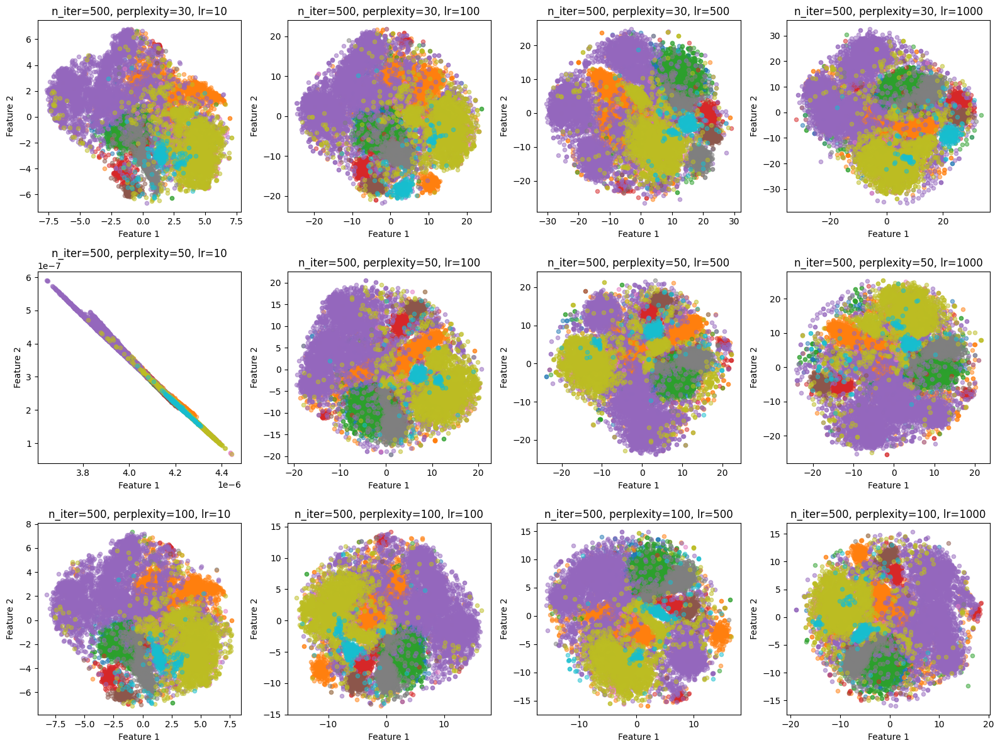

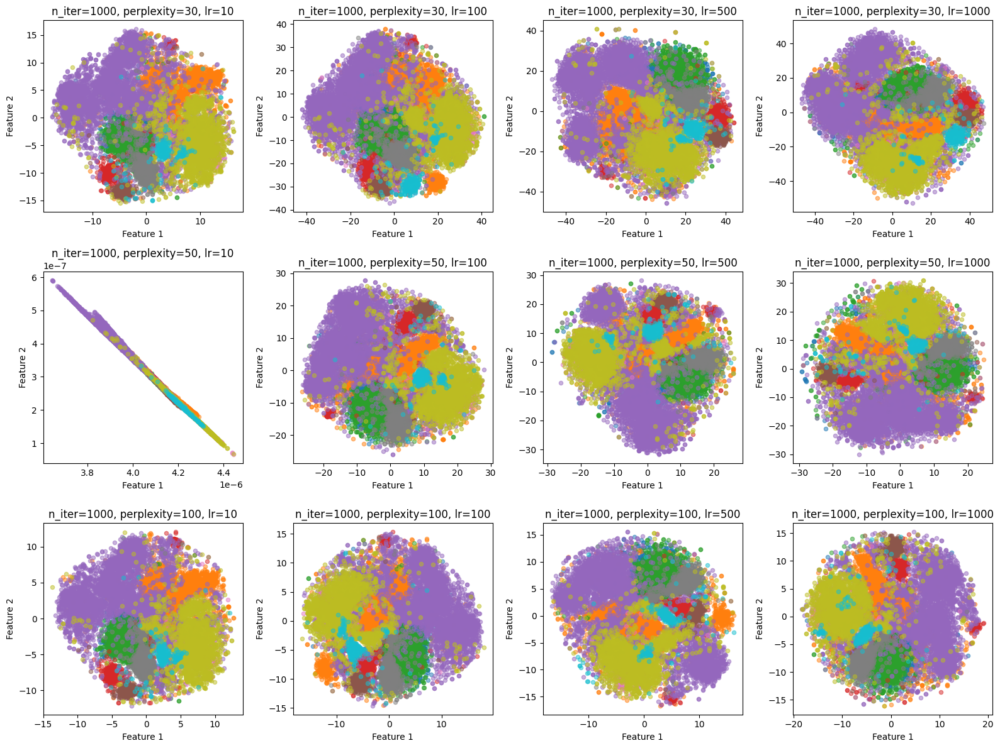

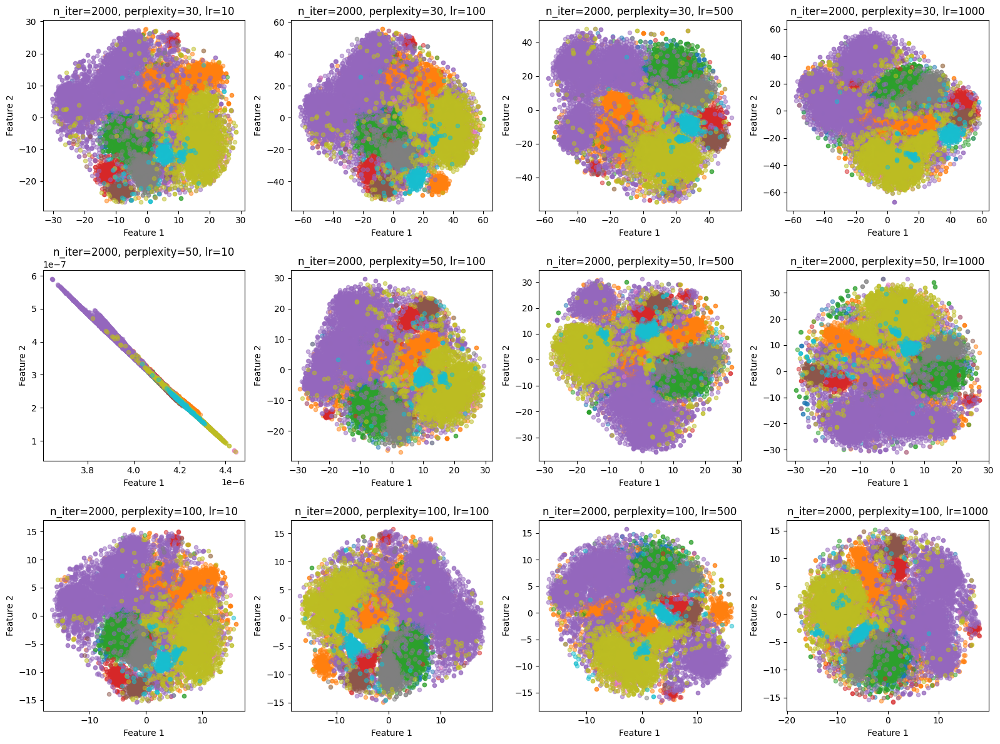

In [12]:
for n_iter in [500, 1000, 2000]:
    fig, axs = plt.subplots(3, 4, figsize=(16, 12)) 
    axs = axs.flatten()

    i = 0
    for perplexity in [30, 50, 100]:
        for learning_rate in [10, 100, 500, 1000]:
            tsne = TSNE(n_components=2, random_state=random_state, n_iter=n_iter, perplexity=perplexity, learning_rate=learning_rate, metric='cosine')
            tsne_results = tsne.fit_transform(data_x_cpu)
            
            plot_no_show(axs[i], tsne_results, data_y_cpu, f'n_iter={n_iter}, perplexity={perplexity}, lr={learning_rate}', size=20)
        
            i += 1

    plt.tight_layout()
    plt.show()

### 6.3 Conclusions
Best values of parameters:
- perplexity = 30
- n_iter = 2000
- l_rate = 500

## 7. Fine-tuned tSNE vs default tSNE on original features

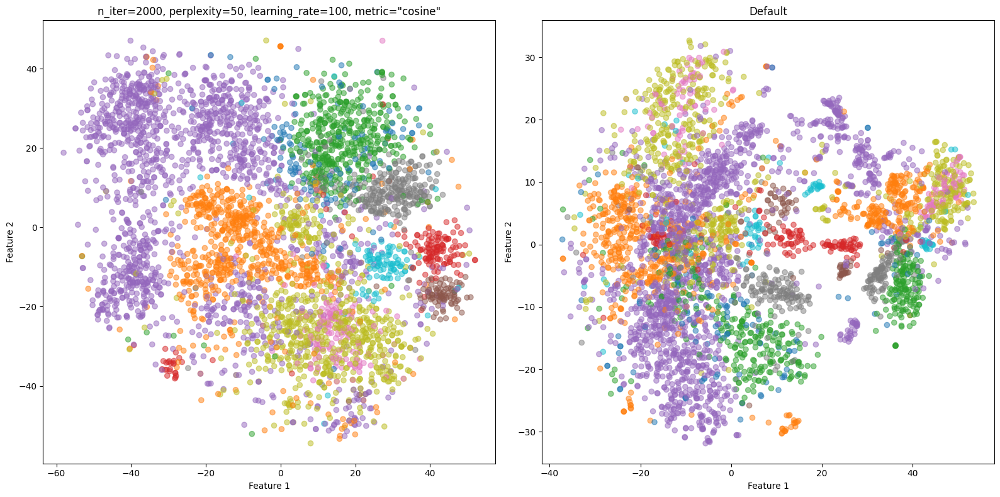

In [7]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8)) 
tsne = TSNE(n_components=2, random_state=random_state, n_iter=2000, perplexity=30, learning_rate=500, metric='cosine')
tsne_results = tsne.fit_transform(data_x_cpu)
plot_no_show(axs[0], tsne_results, data_y_cpu, f'n_iter=2000, perplexity=50, learning_rate=100, metric="cosine"')
    

tsne = TSNE(n_components=2, random_state=random_state)
tsne_results = tsne.fit_transform(data_x_cpu)
plot_no_show(axs[1], tsne_results, data_y_cpu, f'Default')

plt.tight_layout()
plt.show()

## 8. TSNE on original features vs learned representations

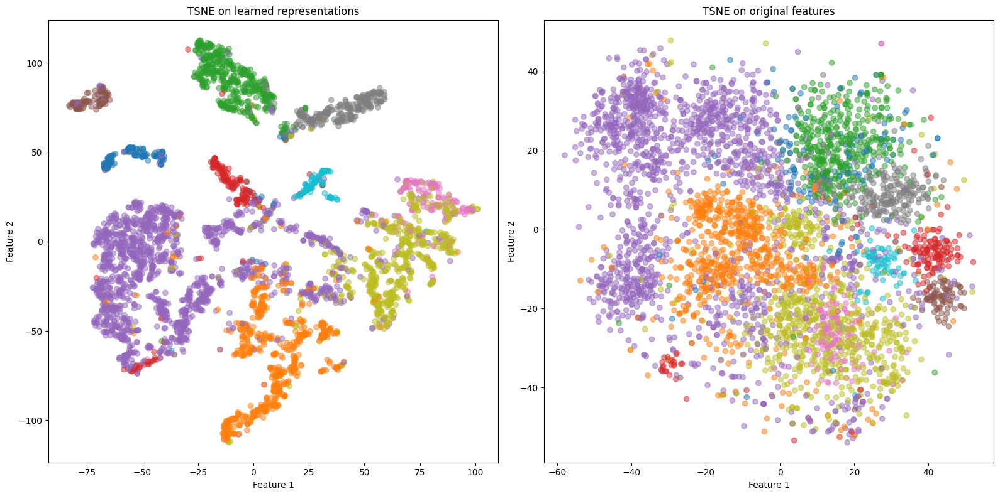

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8)) 
tsne = TSNE(n_components=2, random_state=random_state, n_iter=2000, perplexity=50, learning_rate=500, metric='cosine')
tsne_results = tsne.fit_transform(gnn_output)
plot_no_show(axs[0], tsne_results, data_y_cpu, f'TSNE on learned representations')

tsne = TSNE(n_components=2, random_state=random_state, n_iter=2000, perplexity=30, learning_rate=500, metric='cosine')
tsne_results = tsne.fit_transform(data_x_cpu)
plot_no_show(axs[1], tsne_results, data_y_cpu, f'TSNE on original features')

plt.tight_layout()
plt.show()

## 9. Final conclusions

GNN as feature extraction method proved to be very successful. TSNE results on bare original node features present some level of clusterization, but it is significantly lower than what can be observed on the plot presenting TSNE results on learned representations of the nodes. GNN training provides the information about the graph structure - not only node features.

**Left Plot: t-SNE on GNN output**
- Clustering: The t-SNE visualization on the left, derived from the GNN's learned representations, shows distinct clusters, which implies that the GNN has learned to map the nodes into a feature space where nodes of similar types are closer to each other.
- Class separation: The separation between different colors (representing different classes or node types) indicates that the GNN has effectively learned representations that discriminate between the various classes.
- Data structure: The distribution of points suggests that the GNN has learned complex structures within the data, possibly capturing higher-order interactions between nodes that are not immediately evident in the original feature space.


  
**Right Plot: t-SNE on original features**
- Overlap: The t-SNE plot on the right, based on the original node features, shows more overlap between the different classes. This indicates that the original features have less class discriminative power compared to the GNN's learned representations.
- Class boundaries: The boundaries between classes are less defined, suggesting that the original feature space may not capture the nuances necessary for effective node classification.
- Feature space complexity: It suggests a more complex and entangled feature space, which might pose challenges for traditional classification algorithms that rely on distance metrics or linear separability.
  
**Interpretation**
- GNN's effectiveness: The clear clusters in the GNN's output highlight the model's effectiveness in learning a representation space where similar nodes are grouped together, facilitating better classification performance.
- Advantage of GNN over original features: Comparing the two plots, it becomes apparent that the GNN has added significant value over the original features by transforming the data into a space where classes are more separable.
- Potential for improved visualisation and dimensioanlity reduction: The results suggest that using the GNN's learned representations for DR tasks is likely to yield better results than using the original features, as the former provides a more defined structure for distinguishing between classes.